#Assignment 1: Submit a write-up on the following:
Explain and give an example for

# **Hugging face agents :**

**Answer:** Hugging face agents is virual assestant that has a tools help in building a model and provide a workflows platform also it contain alot of a trained model
for Example
- text generation
- text classification


# **Hugging face pipeline for text generation**
**Answer:**  is an API to loading the model and tokenizer of that model
for Example
- model (bloom)


# **HF inference endpoints**
**Answer :** Hugging Face Inference Endpoints allow developers to deploy and serve machine learning models as scalable APIs

# ** Give feedback on the image generation and explore different models available on the Hugging Face website**
**Answer:** Hugging Face offers a variety of models and tools that makes it easy to experiment with these models through APIs which is great for both developers and non-technical users.


#Assignment 2: Using OpenAI's CLIP Model for Image Captioning and Building an Image Search Engine

#Objective

##In this assignment, you will use OpenAI's CLIP (Contrastive Language-Image Pre-training) model to:
- Generate captions for 15 different images.
- Build a search engine for these images using a larger dataset of images.


##Part 1: Generate Captions for Images
gen image then generate a text as the image for the dog and text
##Part 2: Build an Image Search Engine


##Submission
Submit the following as a **Streamlit** app:

- Your Python code for generating captions and building the search engine.
- A report describing your approach, challenges faced, and how you overcame them.
- Screenshots of the interface and results.

Evaluation Criteria

- Correctness and efficiency of the code.
- Clarity and completeness of the report.
- Usability and functionality of the search engine interface.

#Please don't use any Generative AI Models

##Part 1: Generate Captions for Images

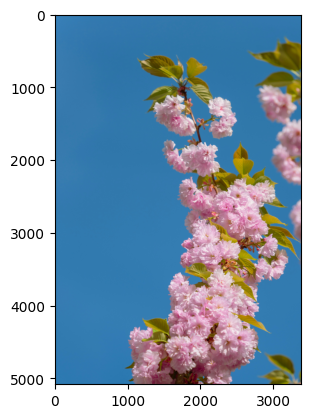

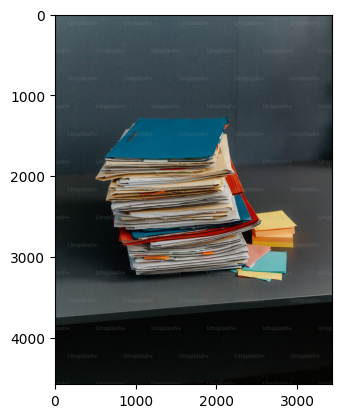

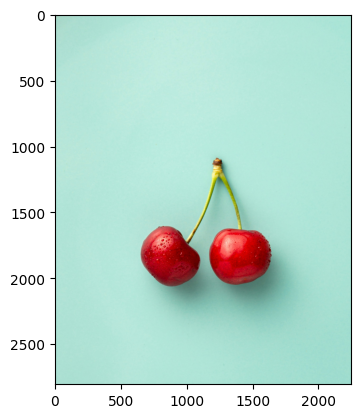

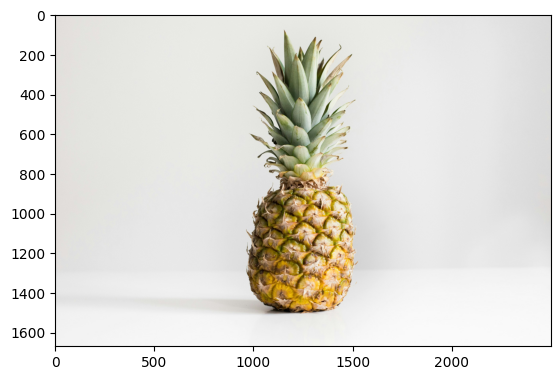

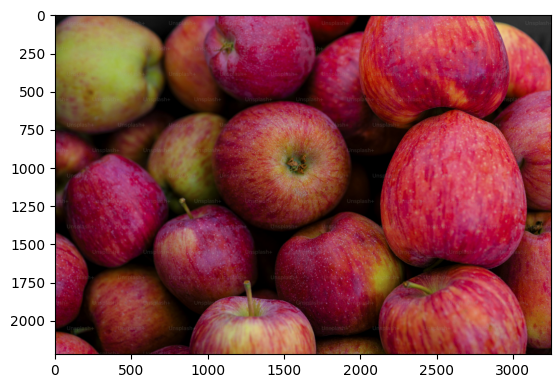

...

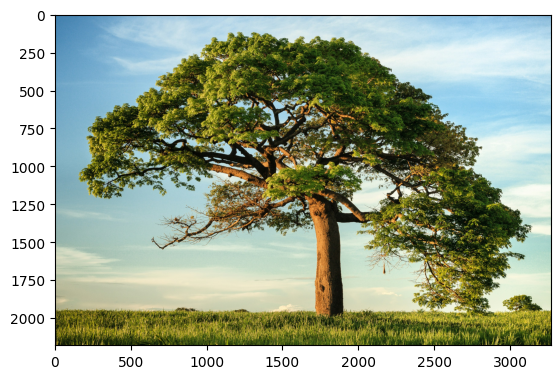

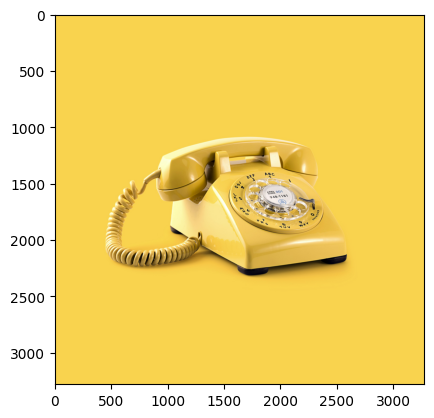

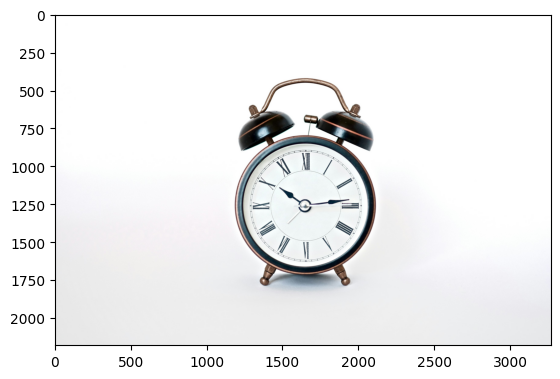

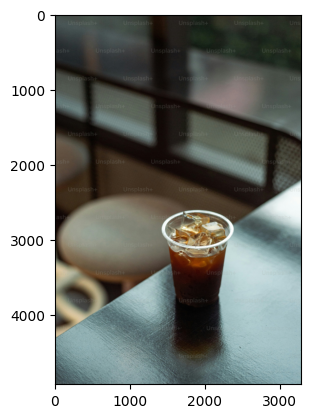

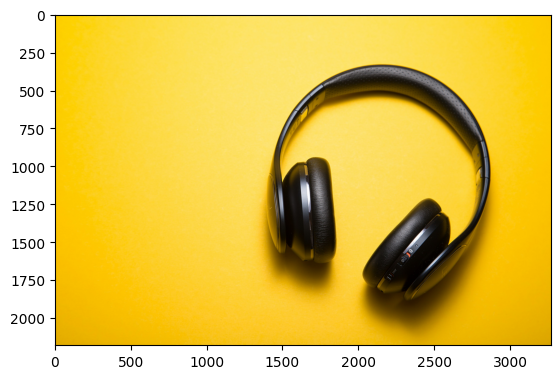

In [1]:
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import requests

urls = [
    "https://images.unsplash.com/photo-1714286304125-1b938456d7b4?q=80&w=3387&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1705091310871-eac4ca9a06b7?q=80&w=3435&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1559181567-c3190ca9959b?q=80&w=2244&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1490885578174-acda8905c2c6?q=80&w=2500&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1667049292983-d2524dd0ef08?q=80&w=3249&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1425082661705-1834bfd09dca?q=80&w=3276&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1668675744027-84e3618e9970?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1675715924047-a9cf6c539d9b?q=80&w=3271&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1691751550782-5d79b8066d8f?q=80&w=3387&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1722172118908-1a97c312ce8c?q=80&w=3387&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1502082553048-f009c37129b9?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1557180295-76eee20ae8aa?q=80&w=3280&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1541480601022-2308c0f02487?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1669261713035-b0dfd9572b0a?q=80&w=3280&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1505740420928-5e560c06d30e?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D"
]

images = [
    Image.open(requests.get(url, stream=True).raw) for url in urls]

# let's see what we have
for image in images:
    plt.show(plt.imshow(np.asarray(image)))

In [2]:
from transformers import CLIPProcessor, CLIPModel

model = CLIPModel.from_pretrained('openai/clip-vit-base-patch32')
processor = CLIPProcessor.from_pretrained('openai/clip-vit-base-patch32')

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [3]:
captions = [
    "A scenic sunset over a calm lake surrounded by mountains",
    "A close-up of a bright yellow sunflower with clear blue sky",
    "A cozy coffee shop interior with wooden furniture and warm lighting",
    "A tranquil forest trail lined with tall, dense trees",
    "A luxurious modern kitchen with marble countertops and sleek design",
    "A serene beach with gentle waves under a cloudy sky",
    "A beautifully plated gourmet dish on a white plate",
    "A snowy mountain peak with a clear blue sky in the background",
    "A bustling city street at night, illuminated by bright neon signs",
    "A playful dog running on a sandy beach during sunset",
    "A vibrant fall landscape with colorful autumn leaves",
    "An aerial view of a winding river cutting through lush green fields",
    "A close-up of hands holding a cup of steaming coffee",
    "A serene mountain lake reflecting the surrounding peaks and trees",
    "A pair of stylish headphones resting on a wooden table"
]

inputs = processor(
    text=captions, images=images,
    return_tensors='pt', padding=True
)

outputs = model(**inputs)

probs = outputs.logits_per_image.argmax(dim=1)
probs

tensor([ 7, 14, 14,  6, 10,  6,  3,  3,  9,  0,  3, 14, 14,  2, 14])

A snowy mountain peak with a clear blue sky in the background


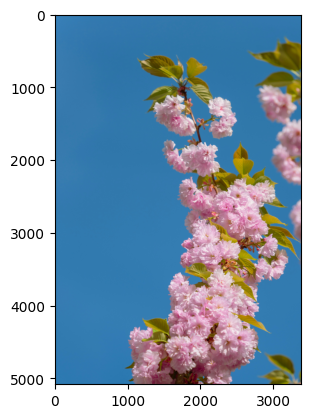

A pair of stylish headphones resting on a wooden table


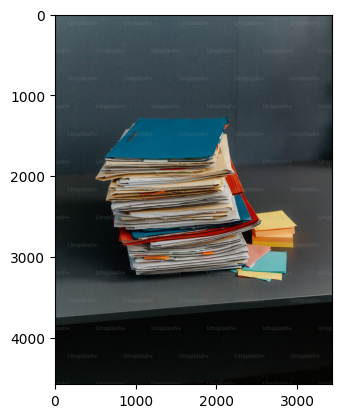

A pair of stylish headphones resting on a wooden table


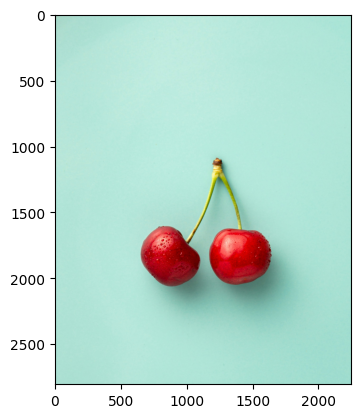

A beautifully plated gourmet dish on a white plate


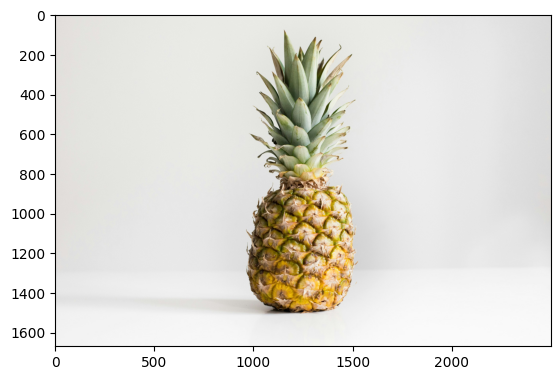

A vibrant fall landscape with colorful autumn leaves


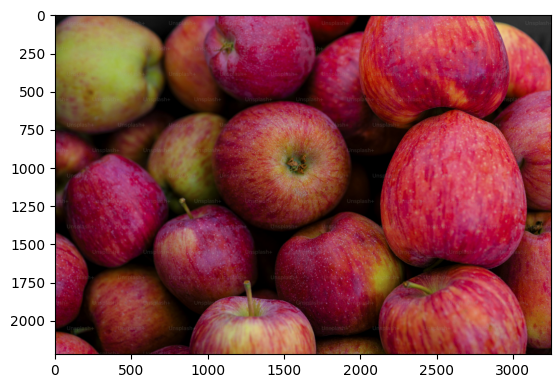

A beautifully plated gourmet dish on a white plate


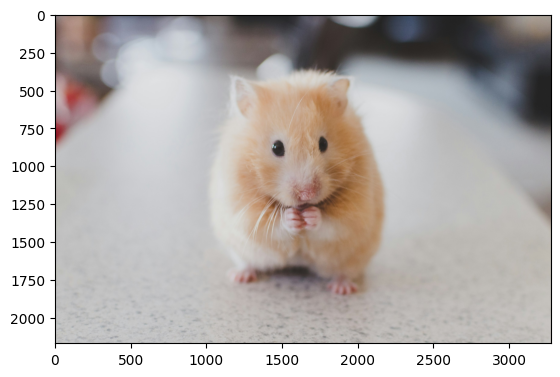

A tranquil forest trail lined with tall, dense trees


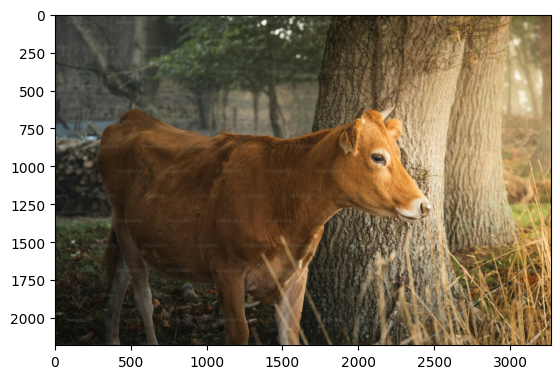

A tranquil forest trail lined with tall, dense trees


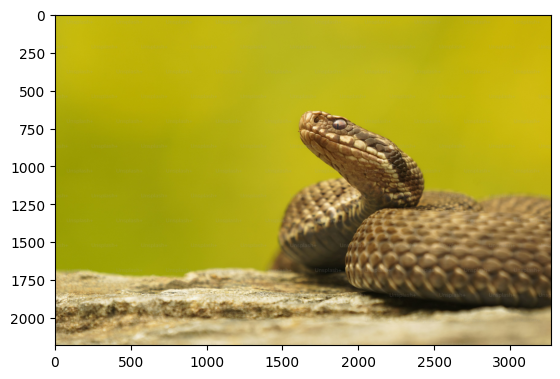

A playful dog running on a sandy beach during sunset


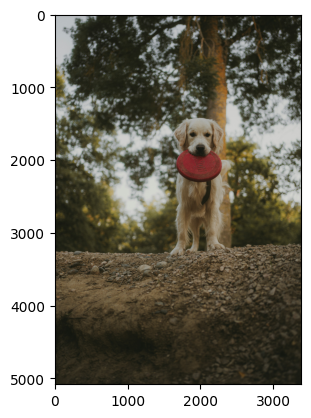

A scenic sunset over a calm lake surrounded by mountains


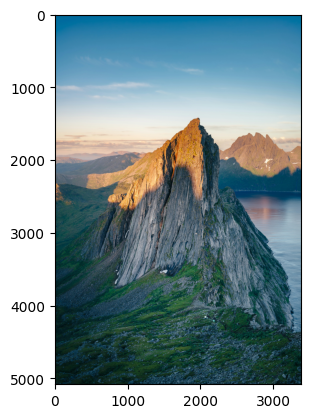

A tranquil forest trail lined with tall, dense trees


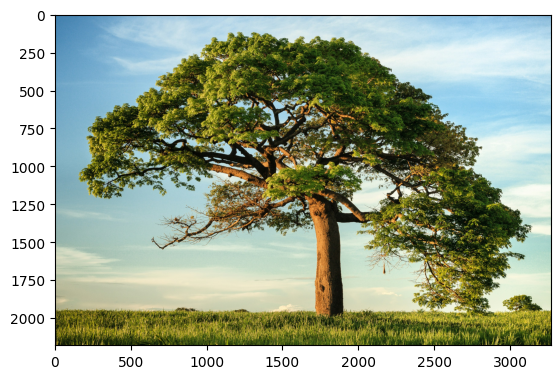

A pair of stylish headphones resting on a wooden table


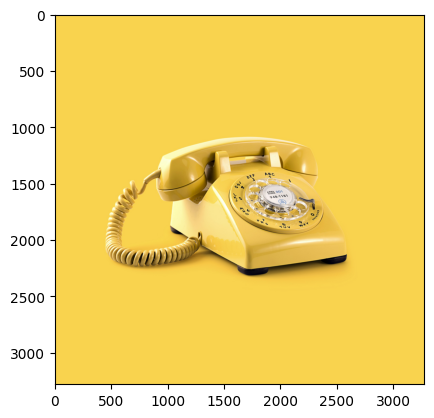

A pair of stylish headphones resting on a wooden table


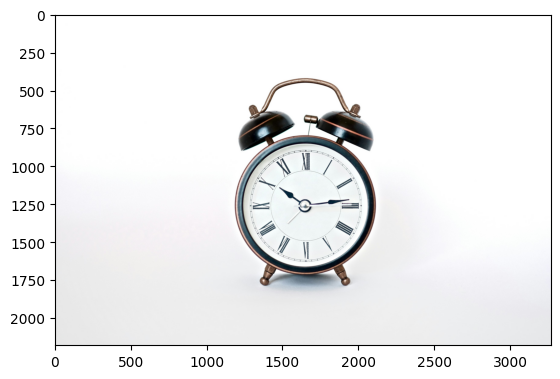

A cozy coffee shop interior with wooden furniture and warm lighting


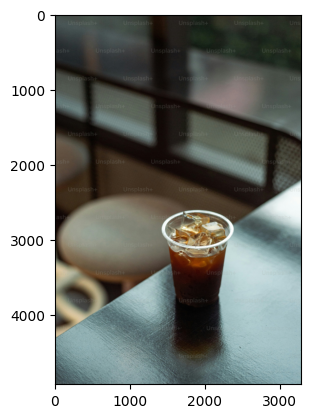

A pair of stylish headphones resting on a wooden table


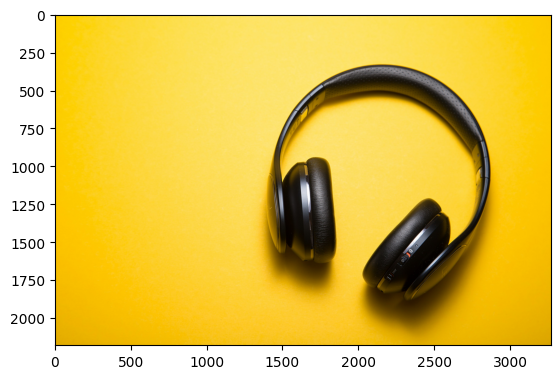

In [4]:
for i, image in enumerate(images):
    argmax = probs[i].item()
    print(captions[argmax])
    plt.show(plt.imshow(np.asarray(image)))

generate text from image

## Gen Text from image

In [5]:
import requests
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")



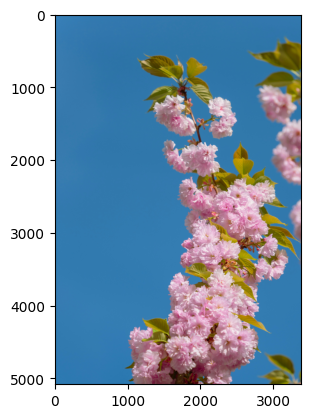

/usr/local/lib/python3.10/dist-packages/transformers/generation/utils.py:1249: UserWarning: Using the model-agnostic default `max_length` (=20) to control the generation length. We recommend setting `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


a pink flowered tree with green leaves


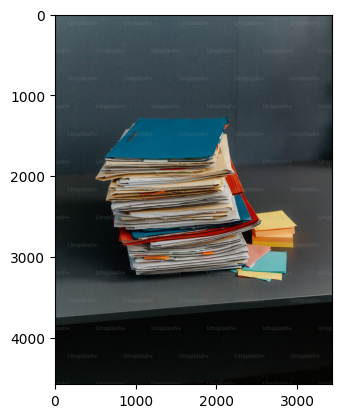

a stack of papers on a table


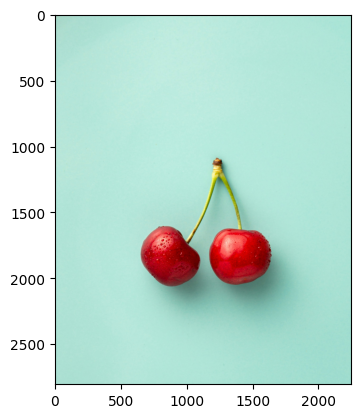

two chers on a blue surface


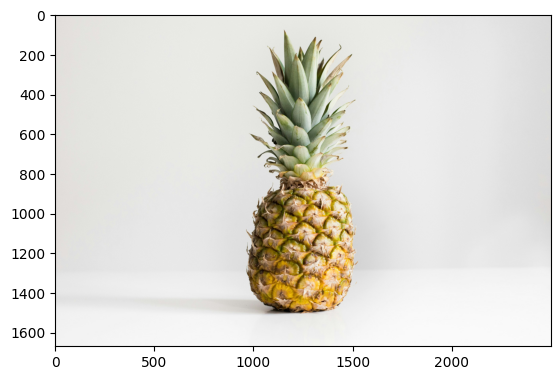

a pineapple on a white surface


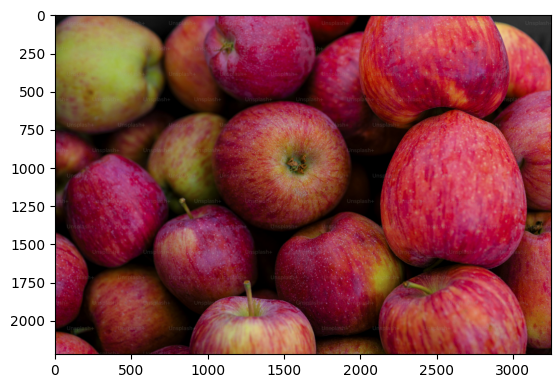

a pile of apples sitting on top of a table


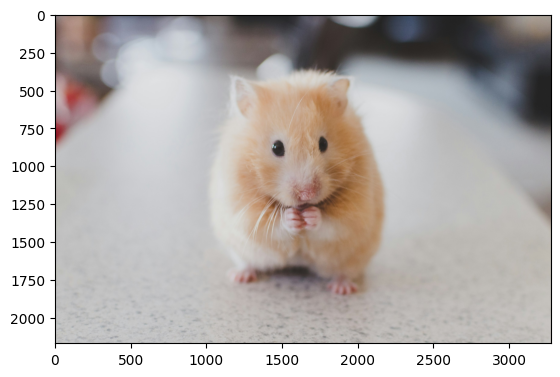

a ham ham ham ham ham ham ham ham ham ham ham ham ham ham ham ham ham ham


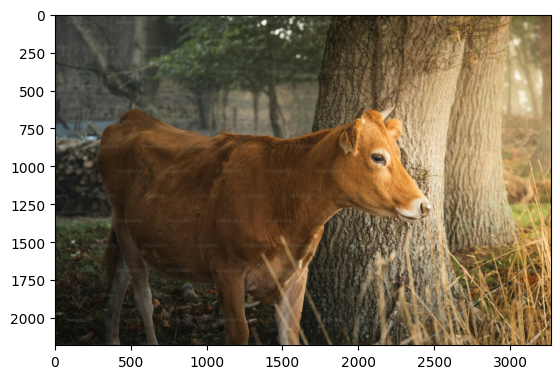

a cow standing next to a tree in a field


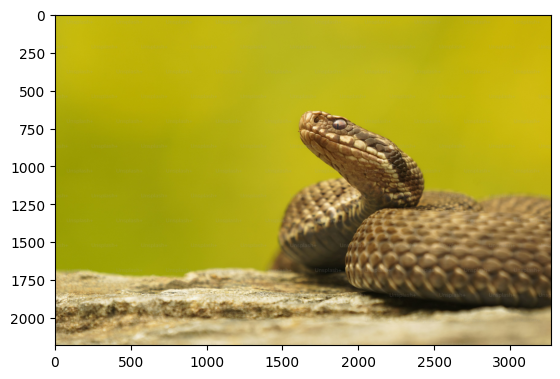

a close up of a snake on a rock


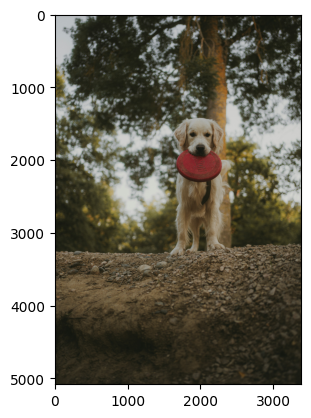

a dog with a fr fr fr fr fr fr fr fr fr fr fr fr fr fr fr


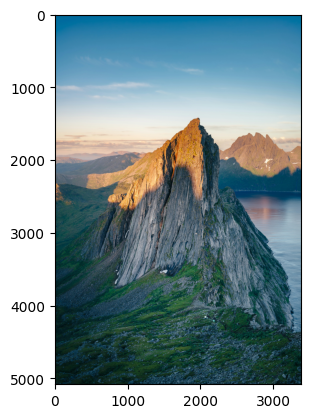

a mountain with a lake in the middle


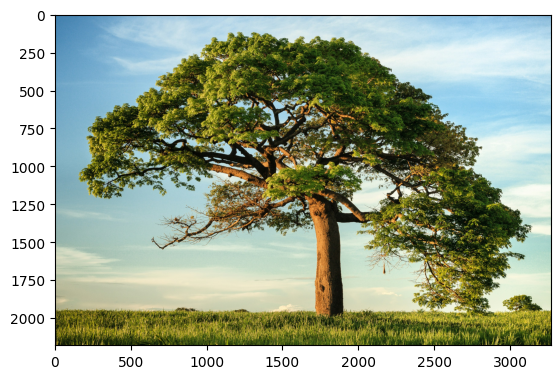

a tree with a large trunk in a grassy field


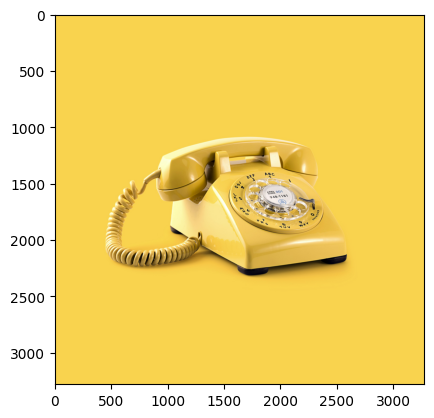

a yellow phone on a yellow background


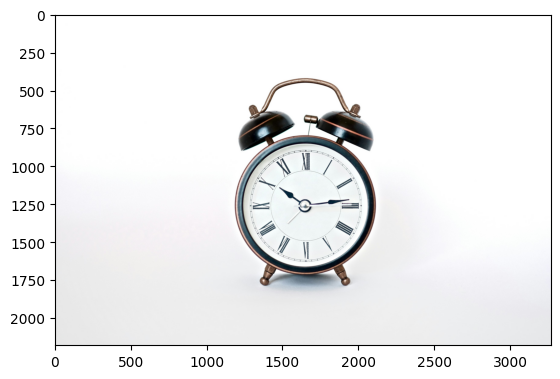

a clock on a white background


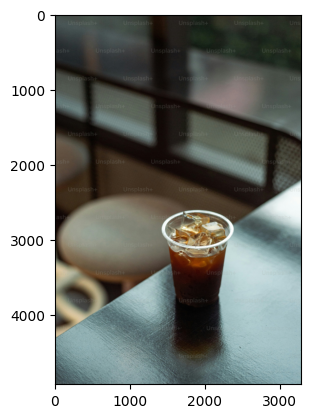

a cup of iced coffee on a table


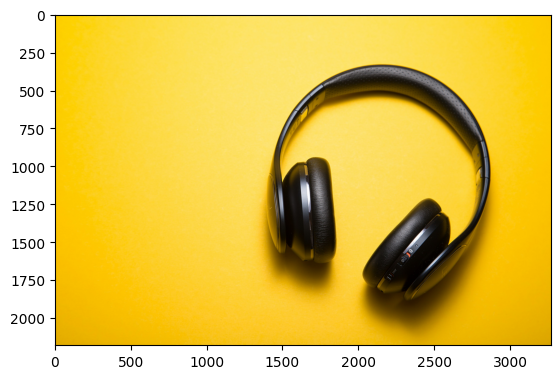

headphones on yellow background


In [6]:
from PIL import Image
import requests

img_url =  [
    "https://images.unsplash.com/photo-1714286304125-1b938456d7b4?q=80&w=3387&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1705091310871-eac4ca9a06b7?q=80&w=3435&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1559181567-c3190ca9959b?q=80&w=2244&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1490885578174-acda8905c2c6?q=80&w=2500&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1667049292983-d2524dd0ef08?q=80&w=3249&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1425082661705-1834bfd09dca?q=80&w=3276&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1668675744027-84e3618e9970?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1675715924047-a9cf6c539d9b?q=80&w=3271&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1691751550782-5d79b8066d8f?q=80&w=3387&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1722172118908-1a97c312ce8c?q=80&w=3387&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1502082553048-f009c37129b9?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1557180295-76eee20ae8aa?q=80&w=3280&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1541480601022-2308c0f02487?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://plus.unsplash.com/premium_photo-1669261713035-b0dfd9572b0a?q=80&w=3280&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D",
    "https://images.unsplash.com/photo-1505740420928-5e560c06d30e?q=80&w=3270&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D"
]

for i in img_url:
    response = requests.get(i, stream=True)
    raw_image1 = Image.open(response.raw).convert('RGB')
    plt.show(plt.imshow(np.asarray(raw_image1)))

    # Process the image and generate the output
    inputs = processor(raw_image1, return_tensors="pt")
    out = model.generate(**inputs)

    # Decode and print the output
    caption = processor.decode(out[0], skip_special_tokens=True)
    print(caption)



#Part 2: Build an Image Search Engine